# ResCenterNet Trial


In [1]:
!pip install -U albumentations

Requirement already up-to-date: albumentations in /usr/local/lib/python3.6/dist-packages (0.4.3)


In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from sklearn.model_selection import train_test_split
from scipy.optimize import minimize
from tqdm.auto import tqdm as tq
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils
from albumentations import Compose, ShiftScaleRotate, RandomCrop, \
    ToGray, CLAHE, GaussNoise, GaussianBlur, RandomGamma, \
    RandomBrightnessContrast, RGBShift, HueSaturationValue,Normalize
from albumentations import *
from albumentations.pytorch import ToTensor
load_data = False 

#PATH = '../input/pku-autonomous-driving/'

# Load data

In [3]:
PATH = './'

In [4]:
train = pd.read_csv(PATH +'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


**ImageId** column contains names of images:

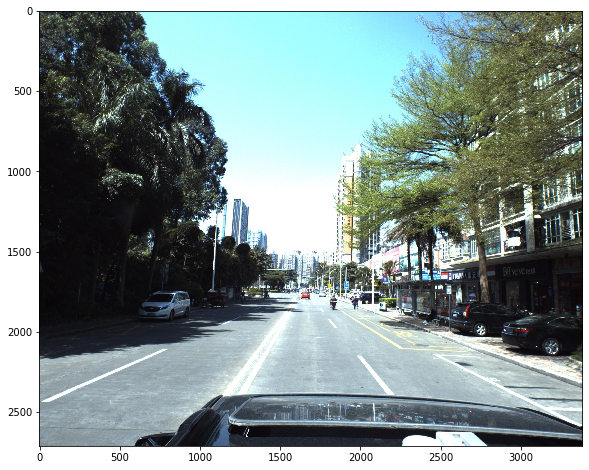

In [5]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_8a6e65317' + '.jpg')
IMG_SHAPE = img.shape

plt.figure(figsize=(15,8))
plt.imshow(img);

In [6]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [7]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


In [8]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x


# 2D Visualization

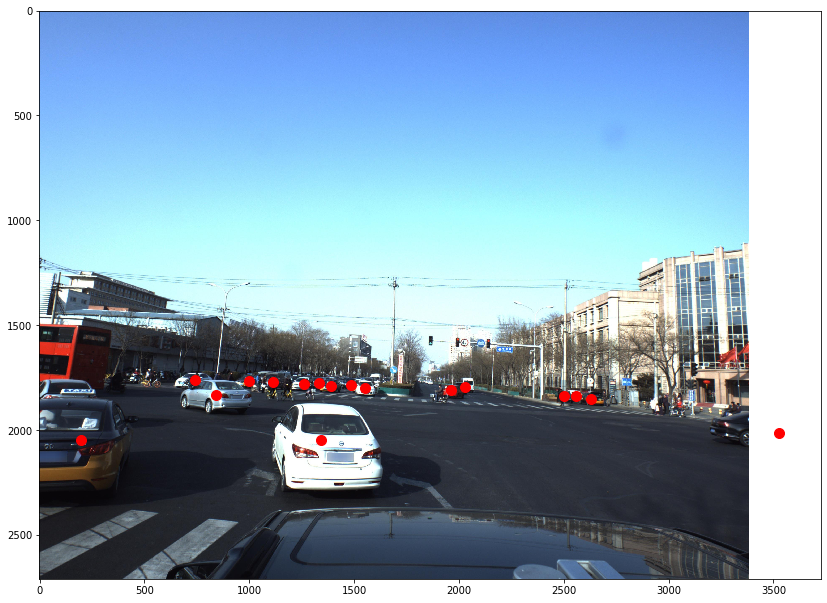

In [9]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image
        ys: y coordinates in the image
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

plt.figure(figsize=(14,14))
plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'))
plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

In [10]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

In [11]:
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

In [12]:
def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img

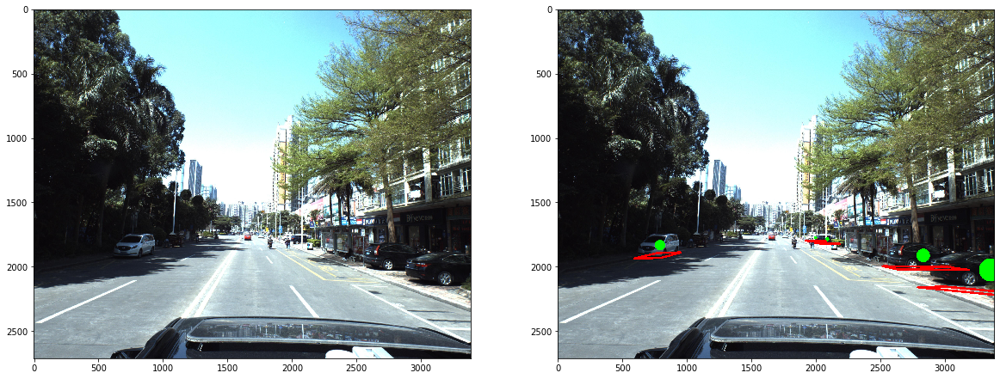

In [13]:
n_rows = 1

for idx in range(n_rows):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    img = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
    axes[0].imshow(img)
    img_vis = visualize(img, str2coords(train['PredictionString'].iloc[idx]))
    axes[1].imshow(img_vis)
    plt.show()

# Image preprocessing

In [14]:
IMG_WIDTH = 512
IMG_HEIGHT = IMG_WIDTH // 1
MODEL_SCALE = 8

def _regr_preprocess(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img):
    img = img[img.shape[0] // 2:]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 4]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels):
    mask = np.zeros([IMG_HEIGHT //MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 4) * IMG_WIDTH / (img.shape[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    return mask, regr

img.shape (512, 512, 3) std: 0.28717014
mask.shape (64, 64) std: 0.03491723
regr.shape (64, 64, 7) std: 0.014771298


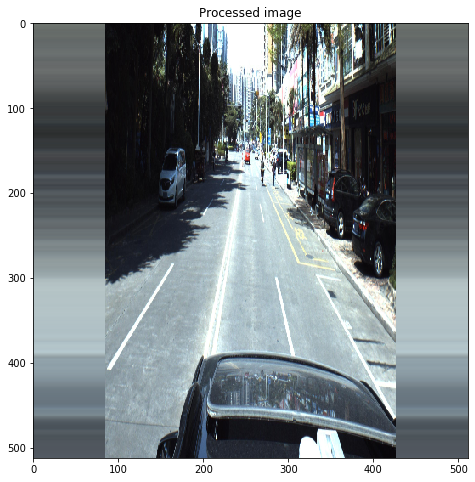

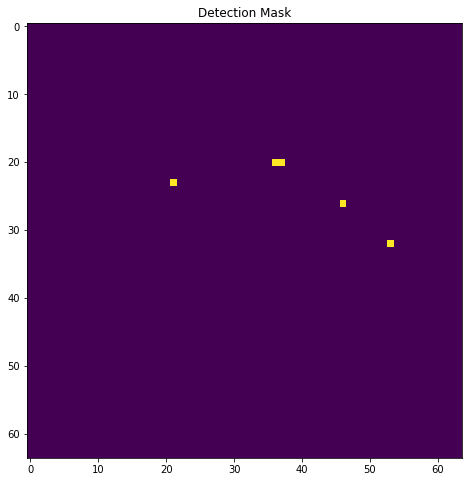

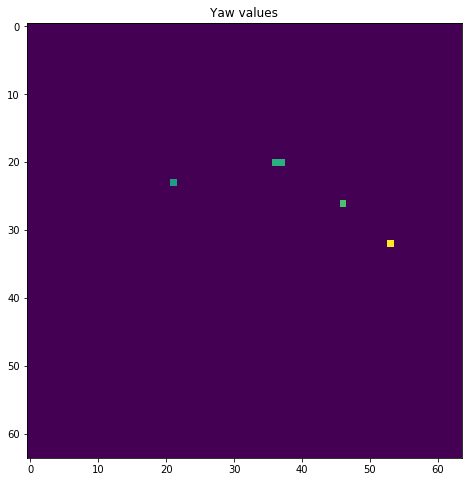

In [15]:
img0 = imread(PATH + 'train_images/' + train['ImageId'][0] + '.jpg')
img = preprocess_image(img0)

mask, regr = get_mask_and_regr(img0, train['PredictionString'][0])

print('img.shape', img.shape, 'std:', np.std(img))
print('mask.shape', mask.shape, 'std:', np.std(mask))
print('regr.shape', regr.shape, 'std:', np.std(regr))

plt.figure(figsize=(8,8))
plt.title('Processed image')
plt.imshow(img)
plt.show()

plt.figure(figsize=(8,8))
plt.title('Detection Mask')
plt.imshow(mask)
plt.show()

plt.figure(figsize=(8,8))
plt.title('Yaw values')
plt.imshow(regr[:,:,-2])
plt.show()

In [16]:
mask.shape

(64, 64)

# PyTorch Dataset

In [17]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=True):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training
        if self.transform :
            if self.training :
                self.aug = Compose([
                            OneOf([
                                MotionBlur(p=.2),
                                MedianBlur(blur_limit=3, p=0.1),
                                Blur(blur_limit=3, p=0.1),
                                ], p=0.2),
                            OneOf([
                                IAASharpen(),
                                IAAEmboss(),
                                RandomBrightnessContrast(),            
                                ], p=0.3),
                            RandomGamma(p=0.2),
                            #RGBShift(p=0.2),
                   # ChannelShuffle(p=0.1),
                   # ToSepia(p=0.5),
                            Cutout(num_holes=20,p=0.1),
                           # HueSaturationValue(p=0.3),
                            #Normalize( mean=(0.485, 0.456, 0.406),
                            #    std=(0.229, 0.224, 0.225),max_pixel_value=255.0, always_apply=False,p=1),
                   # ToTensor()
                   # HueSaturationValue(),
                            ])
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Read image
        img0 = imread(img_name, True)
        img = preprocess_image(img0)
        img = np.rollaxis(img, 2, 0)
        # Get mask and regression maps
        if self.training:
            mask, regr = get_mask_and_regr(img0, labels)
            regr = np.rollaxis(regr, 2, 0)
        else:
            mask, regr = 0, 0
        if self.transform:
            augmented = self.aug(image=img, mask=mask,regr=regr)
            img, mask,regr = augmented['image'],augmented['mask'] ,augmented['regr']
            
        return [img, mask, regr]

In [18]:
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=63)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir)
dev_dataset = CarDataset(df_dev, train_images_dir)
test_dataset = CarDataset(df_test, test_images_dir)

Show some generated examples

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


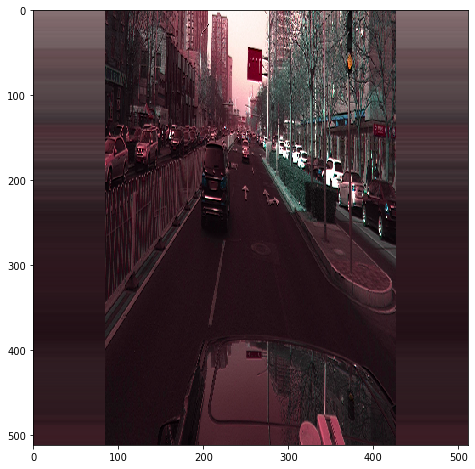

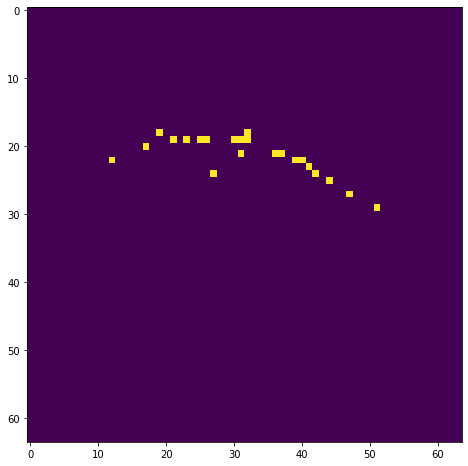

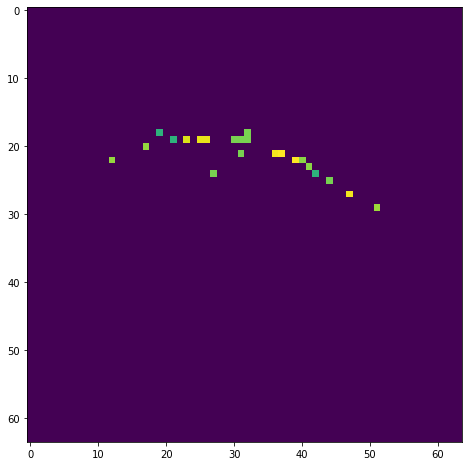

In [19]:
img, mask, regr = train_dataset[0]

plt.figure(figsize=(8,8))
plt.imshow(np.rollaxis(img, 0, 3))
plt.show()

plt.figure(figsize=(8,8))
plt.imshow(mask)
plt.show()

plt.figure(figsize=(8,8))
plt.imshow(regr[-2])
plt.show()

### Meters 

In [20]:
"""Copied from https://www.kaggle.com/robertkag/metric-script"""

import numpy as np
import scipy.stats


def calc_enptropy(probs, base=2):
    _, counts = np.unique(probs, return_counts=True)
    return scipy.stats.entropy(counts, base=base)


def calc_iou(actual, pred):
    intersection = np.count_nonzero(actual * pred)
    union = np.count_nonzero(actual + pred)
    iou_result = intersection / union if union != 0 else 0.
    return iou_result


def calc_ious(actuals, preds):
    ious_ = np.array([calc_iou(a, p) for a, p in zip(actuals, preds)])
    return ious_


def calc_precisions(thresholds, ious):
    thresholds = np.reshape(thresholds, (1, -1))
    ious = np.reshape(ious, (-1, 1))
    ps = ious > thresholds
    mps = ps.mean(axis=1)
    return mps


def indiv_scores(masks, preds):
    ious = calc_ious(masks, preds)
    thresholds = [0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]
    precisions = calc_precisions(thresholds, ious)

    ###### Adjust score for empty masks
    emptyMasks = np.count_nonzero(masks.reshape((len(masks), -1)), axis=1) == 0
    emptyPreds = np.count_nonzero(preds.reshape((len(preds), -1)), axis=1) == 0
    adjust = (emptyMasks == emptyPreds).astype(np.float)
    precisions[emptyMasks] = adjust[emptyMasks]
    ###################
    return precisions


def calc_metric(masks, preds, type='iou', size_average=True):
    if type == 'iou':
        m = indiv_scores(masks, preds)
    elif type == 'pixel_accuracy':
        m = pixel_accuracy(masks, preds)
    else:
        raise NotImplementedError(type)
    if size_average:
        m = m.mean()
    return m


def pixel_accuracy(masks, preds):
    correct = (preds == masks).astype(np.float).sum(axis=(1,2)) / masks[0, :, :].size
    return correct

In [21]:
BATCH_SIZE = 4

# Create data generators - they will produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# PyTorch Model

In [22]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        #  would be a nice idea if the upsampling could be learned too,
        #  but my machine do not have enough memory to handle all those weights
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        
        # for padding issues, see 
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
        else:
            x = x1
        x = self.conv(x)
        return x

def get_mesh(batch_size, shape_x, shape_y):
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    return mesh

In [23]:
import math
from os.path import join

import torch
from torch import nn
import torch.utils.model_zoo as model_zoo

import numpy as np

BatchNorm = nn.BatchNorm2d

def get_model_url(data='imagenet', name='dla34', hash='ba72cf86'):
    return join('http://dl.yf.io/dla/models', data, '{}-{}.pth'.format(name, hash))


def conv3x3(in_planes, out_planes, stride=1):
    "3x3 convolution with padding"
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


class BasicBlock(nn.Module):
    def __init__(self, inplanes, planes, stride=1, dilation=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=3,
                               stride=stride, padding=dilation,
                               bias=False, dilation=dilation)
        self.bn1 = BatchNorm(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=dilation,
                               bias=False, dilation=dilation)
        self.bn2 = BatchNorm(planes)
        self.stride = stride

    def forward(self, x, residual=None):
        if residual is None:
            residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        out += residual
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 2

    def __init__(self, inplanes, planes, stride=1, dilation=1):
        super(Bottleneck, self).__init__()
        expansion = Bottleneck.expansion
        bottle_planes = planes // expansion
        self.conv1 = nn.Conv2d(inplanes, bottle_planes,
                               kernel_size=1, bias=False)
        self.bn1 = BatchNorm(bottle_planes)
        self.conv2 = nn.Conv2d(bottle_planes, bottle_planes, kernel_size=3,
                               stride=stride, padding=dilation,
                               bias=False, dilation=dilation)
        self.bn2 = BatchNorm(bottle_planes)
        self.conv3 = nn.Conv2d(bottle_planes, planes,
                               kernel_size=1, bias=False)
        self.bn3 = BatchNorm(planes)
        self.relu = nn.ReLU(inplace=True)
        self.stride = stride

    def forward(self, x, residual=None):
        if residual is None:
            residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        out += residual
        out = self.relu(out)

        return out


class BottleneckX(nn.Module):
    expansion = 2
    cardinality = 32

    def __init__(self, inplanes, planes, stride=1, dilation=1):
        super(BottleneckX, self).__init__()
        cardinality = BottleneckX.cardinality
        # dim = int(math.floor(planes * (BottleneckV5.expansion / 64.0)))
        # bottle_planes = dim * cardinality
        bottle_planes = planes * cardinality // 32
        self.conv1 = nn.Conv2d(inplanes, bottle_planes,
                               kernel_size=1, bias=False)
        self.bn1 = BatchNorm(bottle_planes)
        self.conv2 = nn.Conv2d(bottle_planes, bottle_planes, kernel_size=3,
                               stride=stride, padding=dilation, bias=False,
                               dilation=dilation, groups=cardinality)
        self.bn2 = BatchNorm(bottle_planes)
        self.conv3 = nn.Conv2d(bottle_planes, planes,
                               kernel_size=1, bias=False)
        self.bn3 = BatchNorm(planes)
        self.relu = nn.ReLU(inplace=True)
        self.stride = stride

    def forward(self, x, residual=None):
        if residual is None:
            residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        out += residual
        out = self.relu(out)

        return out


class Root(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, residual):
        super(Root, self).__init__()
        self.conv = nn.Conv2d(
            in_channels, out_channels, 1,
            stride=1, bias=False, padding=(kernel_size - 1) // 2)
        self.bn = BatchNorm(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.residual = residual

    def forward(self, *x):
        children = x
        x = self.conv(torch.cat(x, 1))
        x = self.bn(x)
        if self.residual:
            x += children[0]
        x = self.relu(x)

        return x


class Tree(nn.Module):
    def __init__(self, levels, block, in_channels, out_channels, stride=1,
                 level_root=False, root_dim=0, root_kernel_size=1,
                 dilation=1, root_residual=False):
        super(Tree, self).__init__()
        if root_dim == 0:
            root_dim = 2 * out_channels
        if level_root:
            root_dim += in_channels
        if levels == 1:
            self.tree1 = block(in_channels, out_channels, stride,
                               dilation=dilation)
            self.tree2 = block(out_channels, out_channels, 1,
                               dilation=dilation)
        else:
            self.tree1 = Tree(levels - 1, block, in_channels, out_channels,
                              stride, root_dim=0,
                              root_kernel_size=root_kernel_size,
                              dilation=dilation, root_residual=root_residual)
            self.tree2 = Tree(levels - 1, block, out_channels, out_channels,
                              root_dim=root_dim + out_channels,
                              root_kernel_size=root_kernel_size,
                              dilation=dilation, root_residual=root_residual)
        if levels == 1:
            self.root = Root(root_dim, out_channels, root_kernel_size,
                             root_residual)
        self.level_root = level_root
        self.root_dim = root_dim
        self.downsample = None
        self.project = None
        self.levels = levels
        if stride > 1:
            self.downsample = nn.MaxPool2d(stride, stride=stride)
        if in_channels != out_channels:
            self.project = nn.Sequential(
                nn.Conv2d(in_channels, out_channels,
                          kernel_size=1, stride=1, bias=False),
                BatchNorm(out_channels)
            )

    def forward(self, x, residual=None, children=None):
        children = [] if children is None else children
        bottom = self.downsample(x) if self.downsample else x
        residual = self.project(bottom) if self.project else bottom
        if self.level_root:
            children.append(bottom)
        x1 = self.tree1(x, residual)
        if self.levels == 1:
            x2 = self.tree2(x1)
            x = self.root(x2, x1, *children)
        else:
            children.append(x1)
            x = self.tree2(x1, children=children)
        return x


class DLA(nn.Module):
    def __init__(self, levels, channels, num_classes=7,
                 block=BasicBlock, residual_root=True, return_levels=True,
                 pool_size=7, linear_root=False):
        super(DLA, self).__init__()
        self.channels = channels
        self.return_levels = return_levels
        self.num_classes = num_classes
        self.base_layer = nn.Sequential(
            nn.Conv2d(3, channels[0], kernel_size=7, stride=1,
                      padding=3, bias=False),
            BatchNorm(channels[0]),
            nn.ReLU(inplace=True))
        self.level0 = self._make_conv_level(
            channels[0], channels[0], levels[0])
        self.level1 = self._make_conv_level(
            channels[0], channels[1], levels[1], stride=2)
        self.level2 = Tree(levels[2], block, channels[1], channels[2], 2,
                           level_root=False,
                           root_residual=residual_root)
        self.level3 = Tree(levels[3], block, channels[2], channels[3], 2,
                           level_root=True, root_residual=residual_root)
        self.level4 = Tree(levels[4], block, channels[3], channels[4], 2,
                           level_root=True, root_residual=residual_root)
        self.level5 = Tree(levels[5], block, channels[4], channels[5], 2,
                           level_root=True, root_residual=residual_root)

        self.avgpool = nn.AvgPool2d(pool_size)
        self.fc = nn.Conv2d(channels[-1], num_classes, kernel_size=1,
                            stride=1, padding=0, bias=True)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            elif isinstance(m, BatchNorm):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _make_level(self, block, inplanes, planes, blocks, stride=1):
        downsample = None
        if stride != 1 or inplanes != planes:
            downsample = nn.Sequential(
                nn.MaxPool2d(stride, stride=stride),
                nn.Conv2d(inplanes, planes,
                          kernel_size=1, stride=1, bias=False),
                BatchNorm(planes),
            )

        layers = []
        layers.append(block(inplanes, planes, stride, downsample=downsample))
        for i in range(1, blocks):
            layers.append(block(inplanes, planes))

        return nn.Sequential(*layers)

    def _make_conv_level(self, inplanes, planes, convs, stride=1, dilation=1):
        modules = []
        for i in range(convs):
            modules.extend([
                nn.Conv2d(inplanes, planes, kernel_size=3,
                          stride=stride if i == 0 else 1,
                          padding=dilation, bias=False, dilation=dilation),
                BatchNorm(planes),
                nn.ReLU(inplace=True)])
            inplanes = planes
        return nn.Sequential(*modules)

    def forward(self, x):
        y = []
        x = self.base_layer(x)
        for i in range(6):
            x = getattr(self, 'level{}'.format(i))(x)
            y.append(x)
        if self.return_levels:
            return y
        else:
            x = self.avgpool(x)
            x = self.fc(x)
            x = x.view(x.size(0), -1)

            return x

    def load_pretrained_model(self,  data='imagenet', name='dla34', hash='ba72cf86'):
        fc = self.fc
        if name.endswith('.pth'):
            model_weights = torch.load(data + name)
        else:
            model_url = get_model_url(data, name, hash)
            model_weights = model_zoo.load_url(model_url)
        num_classes = len(model_weights[list(model_weights.keys())[-1]])
        self.fc = nn.Conv2d(
            self.channels[-1], num_classes,
            kernel_size=1, stride=1, padding=0, bias=True)
        self.load_state_dict(model_weights)
        self.fc = fc


def dla34(pretrained, **kwargs):  # DLA-34
    model = DLA([1, 1, 1, 2, 2, 1],
                [16, 32, 64, 128, 256, 512],
                block=BasicBlock, **kwargs)
    if pretrained:
        model.load_pretrained_model(data='imagenet', name='dla34', hash='ba72cf86')
    return model


def dla46_c(pretrained=None, **kwargs):  # DLA-46-C
    Bottleneck.expansion = 2
    model = DLA([1, 1, 1, 2, 2, 1],
                [16, 32, 64, 64, 128, 256],
                block=Bottleneck, **kwargs)
    if pretrained is not None:
        model.load_pretrained_model(pretrained, 'dla46_c')
    return model


def dla46x_c(pretrained=None, **kwargs):  # DLA-X-46-C
    BottleneckX.expansion = 2
    model = DLA([1, 1, 1, 2, 2, 1],
                [16, 32, 64, 64, 128, 256],
                block=BottleneckX, **kwargs)
    if pretrained is not None:
        model.load_pretrained_model(pretrained, 'dla46x_c')
    return model


def dla60x_c(pretrained, **kwargs):  # DLA-X-60-C
    BottleneckX.expansion = 2
    model = DLA([1, 1, 1, 2, 3, 1],
                [16, 32, 64, 64, 128, 256],
                block=BottleneckX, **kwargs)
    if pretrained:
        model.load_pretrained_model(data='imagenet', name='dla60x_c', hash='b870c45c')
    return model


def dla60(pretrained=None, **kwargs):  # DLA-60
    Bottleneck.expansion = 2
    model = DLA([1, 1, 1, 2, 3, 1],
                [16, 32, 128, 256, 512, 1024],
                block=Bottleneck, **kwargs)
    if pretrained is not None:
        model.load_pretrained_model(pretrained, 'dla60')
    return model


def dla60x(pretrained=None, **kwargs):  # DLA-X-60
    BottleneckX.expansion = 2
    model = DLA([1, 1, 1, 2, 3, 1],
                [16, 32, 128, 256, 512, 1024],
                block=BottleneckX, **kwargs)
    if pretrained is not None:
        model.load_pretrained_model(pretrained, 'dla60x')
    return model


def dla102(pretrained=None, **kwargs):  # DLA-102
    Bottleneck.expansion = 2
    model = DLA([1, 1, 1, 3, 4, 1], [16, 32, 128, 256, 512, 1024],
                block=Bottleneck, residual_root=True, **kwargs)
    if pretrained is not None:
        model.load_pretrained_model(pretrained, 'dla102')
    return model


def dla102x(pretrained=None, **kwargs):  # DLA-X-102
    BottleneckX.expansion = 2
    model = DLA([1, 1, 1, 3, 4, 1], [16, 32, 128, 256, 512, 1024],
                block=BottleneckX, residual_root=True, **kwargs)
    if pretrained is not None:
        model.load_pretrained_model(pretrained, 'dla102x')
    return model


def dla102x2(pretrained=None, **kwargs):  # DLA-X-102 64
    BottleneckX.cardinality = 64
    model = DLA([1, 1, 1, 3, 4, 1], [16, 32, 128, 256, 512, 1024],
                block=BottleneckX, residual_root=True, **kwargs)
    if pretrained is not None:
        model.load_pretrained_model(pretrained, 'dla102x2')
    return model


def dla169(pretrained=None, **kwargs):  # DLA-169
    Bottleneck.expansion = 2
    model = DLA([1, 1, 2, 3, 5, 1], [16, 32, 128, 256, 512, 1024],
                block=Bottleneck, residual_root=True, **kwargs)
    if pretrained is not None:
        model.load_pretrained_model(pretrained, 'dla169')
    return model


def set_bn(bn):
    global BatchNorm
    BatchNorm = bn
    dla.BatchNorm = bn


class Identity(nn.Module):
    def __init__(self):
        super(Identity, self).__init__()






In [24]:
base_model =dla34(pretrained =True)
x= torch.randn((1,3,512,512))


In [25]:
y =base_model(x)[5]
y.shape

torch.Size([1, 512, 16, 16])

In [26]:
class CentResnet(nn.Module):
    '''Mixture of previous classes'''
    def __init__(self, n_classes):
        super(CentResnet, self).__init__()
        self.base_model = dla34(pretrained=True)
        
        # Lateral layers convert resnet outputs to a common feature size
        self.lat8 = nn.Conv2d(128, 256, 1)
        self.lat16 = nn.Conv2d(256, 256, 1)
        self.lat32 = nn.Conv2d(512, 256, 1)
        self.bn8 = nn.BatchNorm2d(256)
        self.bn16 = nn.BatchNorm2d(256)
        self.bn32 = nn.BatchNorm2d(256)

       
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 , 512) #+ 1024
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)
        
    
    def forward(self, x):
        batch_size = x.shape[0]
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        x0 = torch.cat([x, mesh1], 1)
        x1 = self.mp(self.conv0(x0))
        x2 = self.mp(self.conv1(x1))
        x3 = self.mp(self.conv2(x2))
        x4 = self.mp(self.conv3(x3))
        
        #feats = self.base_model.extract_features(x)
                # Run frontend network
        feats32 = self.base_model(x)[5]
        #lat8 = F.relu(self.bn8(self.lat8(feats8)))
        #lat16 = F.relu(self.bn16(self.lat16(feats16)))
        lat32 = F.relu(self.bn32(self.lat32(feats32)))
        
        # Add positional info
        mesh2 = get_mesh(batch_size, lat32.shape[2], lat32.shape[3])
        feats = torch.cat([lat32, mesh2], 1)
        #print(feats.shape)
        #print (x4.shape)
        x = self.up1(feats, x4)
        x = self.up2(x, x3)
        x = self.outc(x)
        return x

In [27]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 20 #6

model = CentResnet(8).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
#optimizer =  RAdam(model.parameters(), lr = 0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda


In [28]:
img_batch = torch.randn((1,3,512,512))

In [29]:
test = model(img_batch.to(device))

In [30]:
test.shape

torch.Size([1, 8, 64, 64])

In [31]:
#model.load_state_dict(torch.load(f'../input/centernet2/model.pth'))
#model.eval();

# Training

In [32]:
def dice_loss(input, target):
    input = torch.sigmoid(input)
    smooth = 1.0
    iflat = input.view(-1)
    tflat = target.view(-1)
    intersection = (iflat * tflat).sum()
    return ((2.0 * intersection + smooth) / (iflat.sum() + tflat.sum() + smooth))

def criterion(prediction, mask, regr,weight=0.4, size_average=True):
    # Binary mask loss
    pred_mask = torch.sigmoid(prediction[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)
    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    mask_loss = -mask_loss.mean(0).sum()
    #mask_loss = mask_loss + dice_loss(prediction[:, 0], mask)


    # Regression L1 loss
    pred_regr = prediction[:, 1:]
    regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    regr_loss = regr_loss.mean(0)
    
    # Sum
    loss = mask_loss + regr_loss 
    if not size_average:
        loss *= prediction.shape[0]
    return loss ,mask_loss , regr_loss

In [33]:
def train(epoch, history=None):
    accuracy =0
    smooth_accuracy = 0
    running_metric, running_accuracy =  0.0, 0.0
    smooth = 0.1
    total = 0.0
    model.train()
    t = tqdm(train_loader)
    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(t):

        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        regr_batch = regr_batch.to(device)
        
        optimizer.zero_grad()
        output = model(img_batch)
        total += mask_batch.size(0)
        if epoch < 10 :
          loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.2)
        else:
          loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.6)  
        accuracy = torch.mean(((torch.sigmoid(output[:,0]) >= 0.8) == (mask_batch == 1)).to(torch.float)).item()
        smooth_accuracy = accuracy if smooth_accuracy is None else \
            smooth * accuracy + (1. - smooth) * smooth_accuracy
        preds_batch = torch.sigmoid(output[:, 0]) >0.5
        predictions_numpy = preds_batch.cpu().detach().numpy()
        targets_numpy = mask_batch.cpu().numpy()
        metric_array = calc_metric(targets_numpy, predictions_numpy, type='iou', size_average=False)
        metric = metric_array.mean()
        running_metric += metric_array.sum()
        running_accuracy += calc_metric(targets_numpy, predictions_numpy, type='pixel_accuracy',
                                        size_average=False).sum()
        
        t.set_description(f'(mask={mask_loss:.2f}) (reg={regr_loss:.3f} (acc={running_accuracy/total:.4f})')
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()
    
    epoch_metric = running_metric / total
    epoch_accuracy = running_accuracy / total
    print(f'epoch metric: {epoch_metric}')
    print(f'epoch Accuracy: {epoch_accuracy}')

    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}\tMaskLoss: {:.6f}\tRegLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data,
        mask_loss.data,
        regr_loss.data))

def evaluate(epoch, history=None):
    model.eval()
    loss = 0
    valid_loss = 0
    valid_mask_loss = 0
    valid_regr_loss = 0
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            regr_batch = regr_batch.to(device)

            output = model(img_batch)

            if epoch < 10 :
              loss,mask_loss, regr_loss= criterion(output, mask_batch, regr_batch,0.2, size_average=False)
              valid_loss += loss
              valid_mask_loss += mask_loss
              valid_regr_loss += regr_loss
            else :
              loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.6, size_average=False)
              valid_loss += loss 
              valid_mask_loss += mask_loss
              valid_regr_loss += regr_loss 

    
    valid_loss /= len(dev_loader.dataset)
    valid_mask_loss /= len(dev_loader.dataset)
    valid_regr_loss /= len(dev_loader.dataset)
    
    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = valid_loss.cpu().numpy()
        history.loc[epoch, 'mask_loss'] = valid_mask_loss.cpu().numpy()
        history.loc[epoch, 'regr_loss'] = valid_regr_loss.cpu().numpy()

    
    print('Dev loss: {:.4f}'.format(valid_loss))

In [34]:
%%time
import gc

history = pd.DataFrame()

for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train(epoch, history)
    evaluate(epoch, history)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



epoch metric: 9.480919649205973e-05
epoch Accuracy: 0.9953595921167635
Train Epoch: 0 	LR: 0.001000	Loss: 23.106943	MaskLoss: 22.080851	RegLoss: 1.026093
Dev loss: 37.5215



epoch metric: 0.0027731689973927477
epoch Accuracy: 0.9973968556492948
Train Epoch: 1 	LR: 0.001000	Loss: 40.048027	MaskLoss: 39.126038	RegLoss: 0.921988
Dev loss: 30.1839



epoch metric: 0.014624318558900227
epoch Accuracy: 0.9976007787501482
Train Epoch: 2 	LR: 0.001000	Loss: 32.844860	MaskLoss: 32.011642	RegLoss: 0.833217
Dev loss: 28.6056


KeyboardInterrupt: 

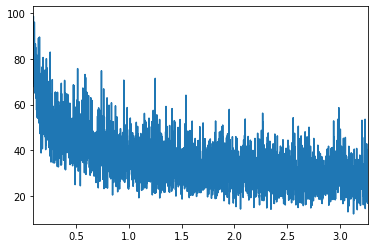

In [35]:
history['train_loss'].iloc[100:].plot();

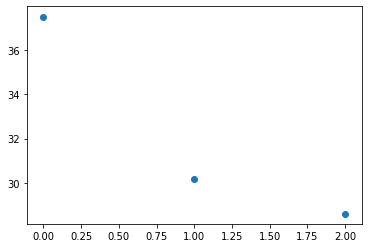

In [36]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

# Visualize predictions

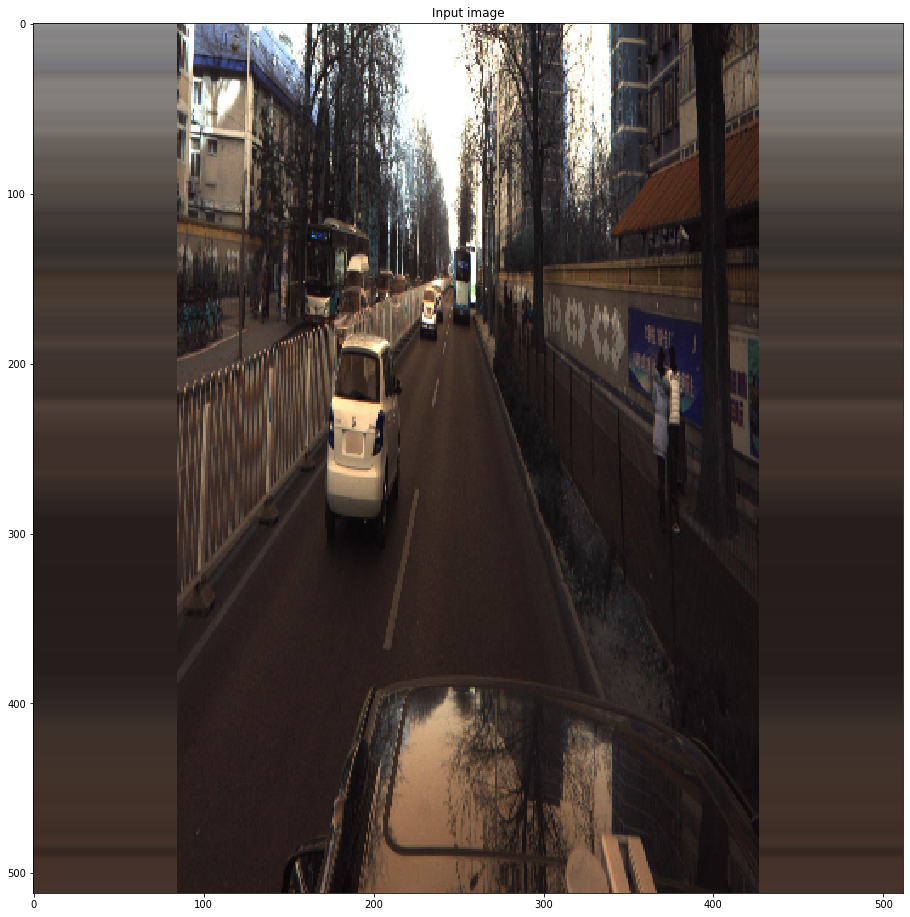

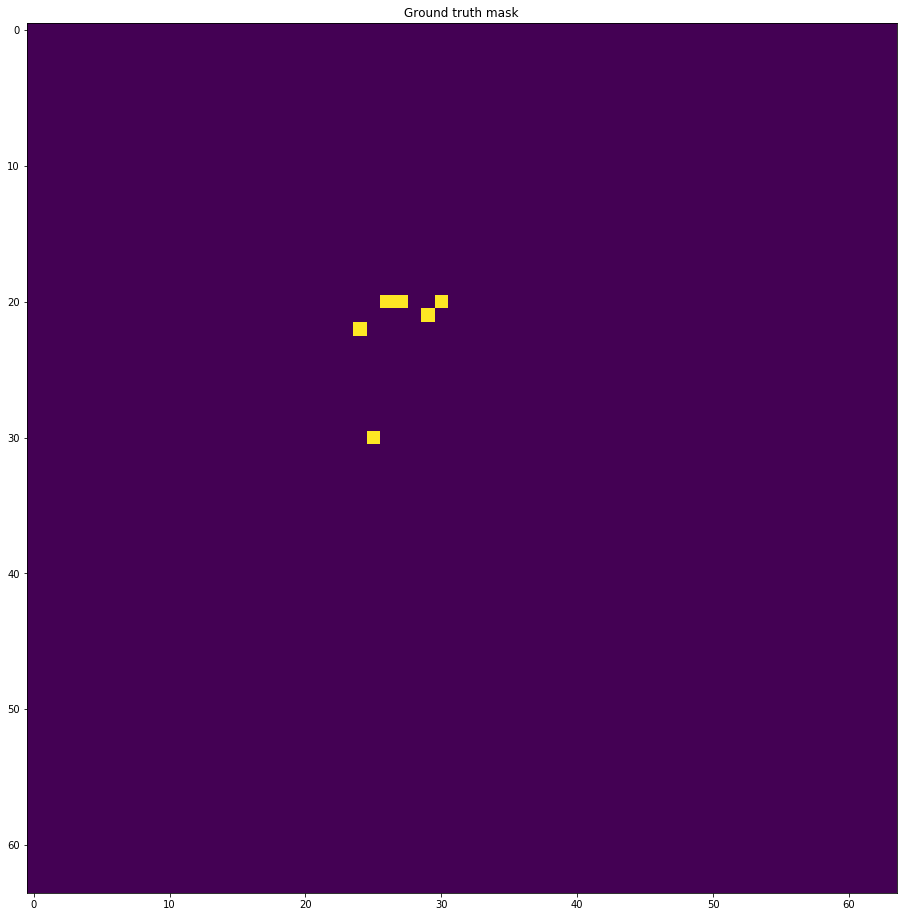

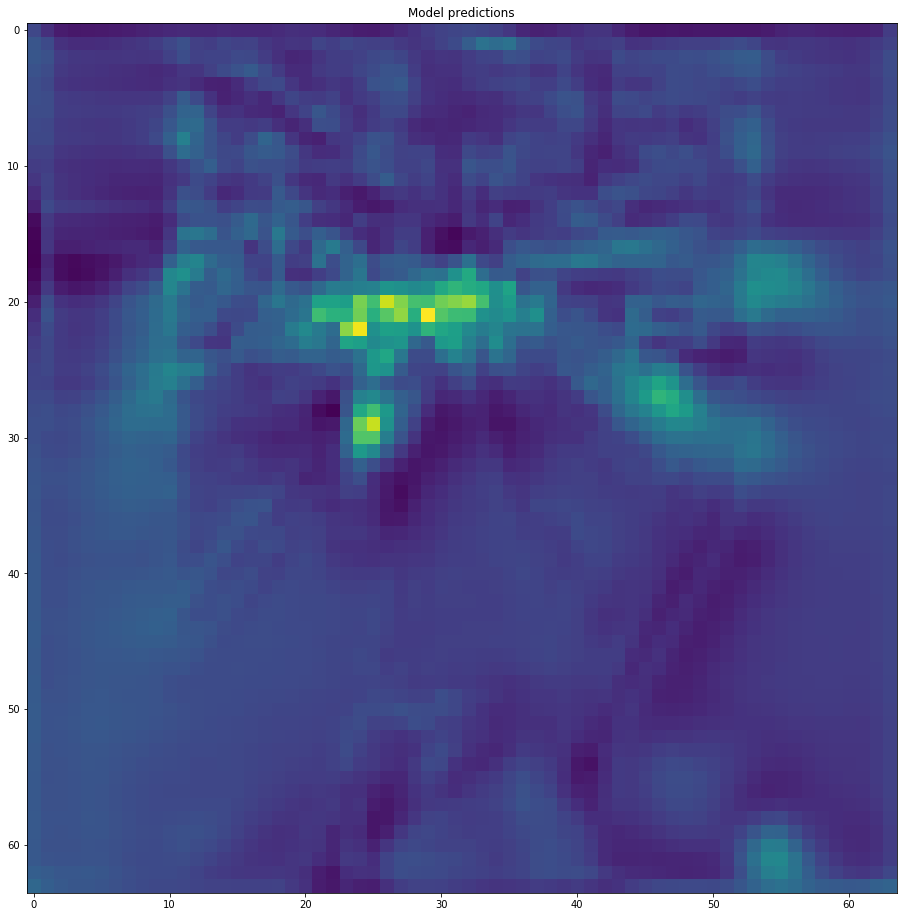

[[-10.24833   -11.451115  -12.270829  ... -12.074968  -11.851621
  -10.794867 ]
 [ -9.530141  -10.106009  -11.288638  ... -11.21093   -10.895037
  -10.481828 ]
 [ -9.464023   -9.730624  -10.767744  ... -11.159882  -10.660736
  -10.0555   ]
 ...
 [ -9.3338995  -9.643257   -9.714468  ... -11.492969  -11.241187
  -10.7216625]
 [ -9.01302    -9.148054   -9.406002  ... -11.069356  -10.795998
  -10.272914 ]
 [ -8.503985   -9.005926   -9.293481  ...  -9.2696495  -8.901949
   -8.712405 ]]


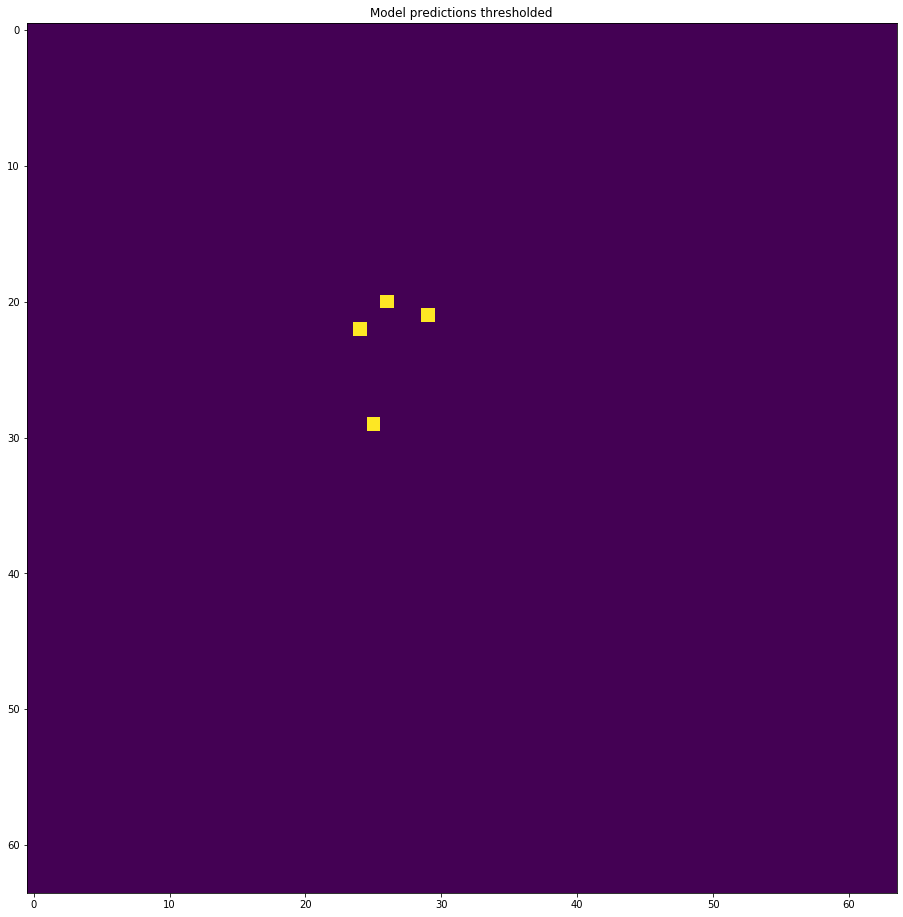

In [37]:
img, mask, regr = dev_dataset[0]

plt.figure(figsize=(16,16))
plt.title('Input image')
plt.imshow(np.rollaxis(img, 0, 3))
plt.show()

plt.figure(figsize=(16,16))
plt.title('Ground truth mask')
plt.imshow(mask)
plt.show()

output = model(torch.tensor(img[None]).to(device))
logits = output[0,0].data.cpu().numpy()

plt.figure(figsize=(16,16))
plt.title('Model predictions')
plt.imshow(logits)
plt.show()

print(logits)
plt.figure(figsize=(16,16))
plt.title('Model predictions thresholded')
plt.imshow(logits > 0)
plt.show()

In [38]:
## Simple test of probabilities
act = torch.nn.Sigmoid()
logtens = torch.from_numpy(logits)
probs = act(logtens)
probs = probs[probs>0.03]
print(probs)

tensor([0.1607, 0.0400, 0.5537, 0.1909, 0.0468, 0.0418, 0.1393, 0.1954, 0.2823,
        0.0469, 0.0387, 0.1354, 0.0776, 0.2528, 0.7943, 0.0683, 0.0362, 0.0339,
        0.2319, 0.7341, 0.0406, 0.1235, 0.5238, 0.0669, 0.0664])


In [39]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0):
    def distance_fn(xyz):
        x, y, z = xyz
        x, y = convert_3d_to_2d(x, y, z0)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + IMG_SHAPE[1] // 4) * IMG_WIDTH / (IMG_SHAPE[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        return (x-r)**2 + (y-c)**2
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z0

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def extract_coords(prediction):
    logits = prediction[0]
    regr_output = prediction[1:]
    points = np.argwhere(logits > 0)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    for r, c in points:
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

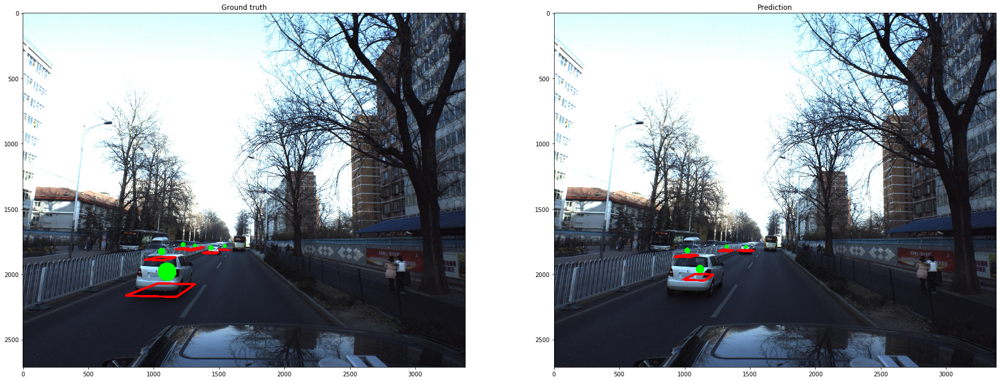

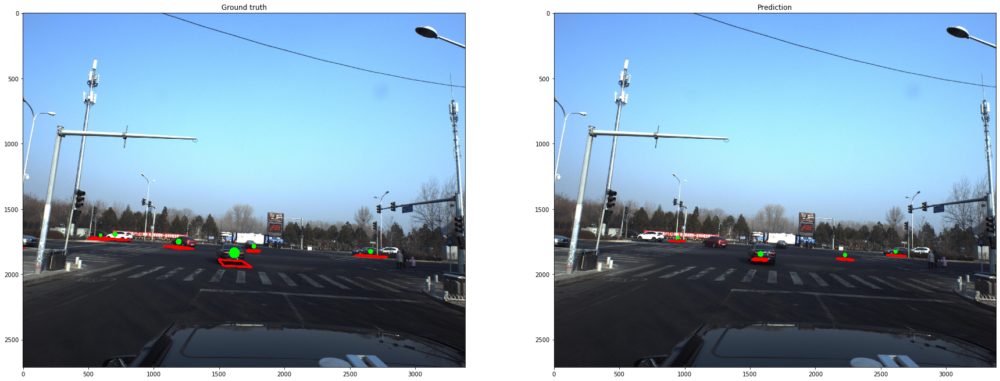

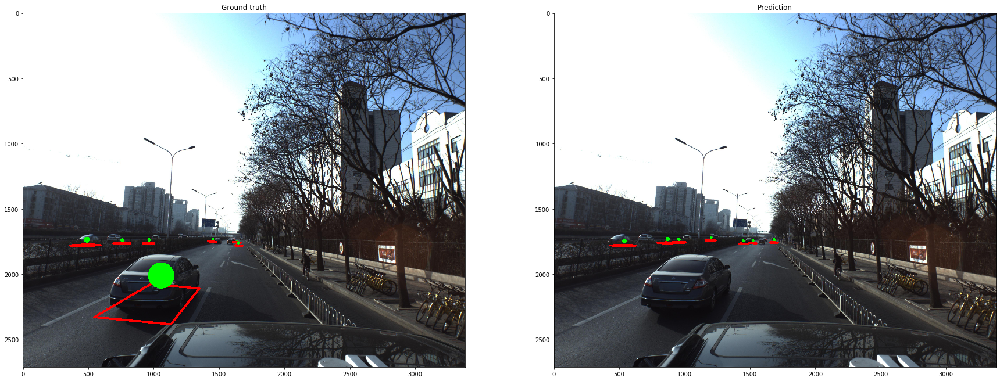

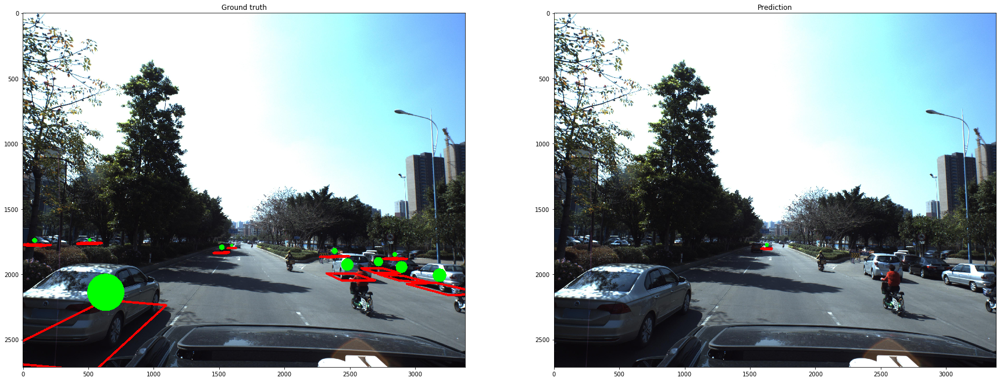

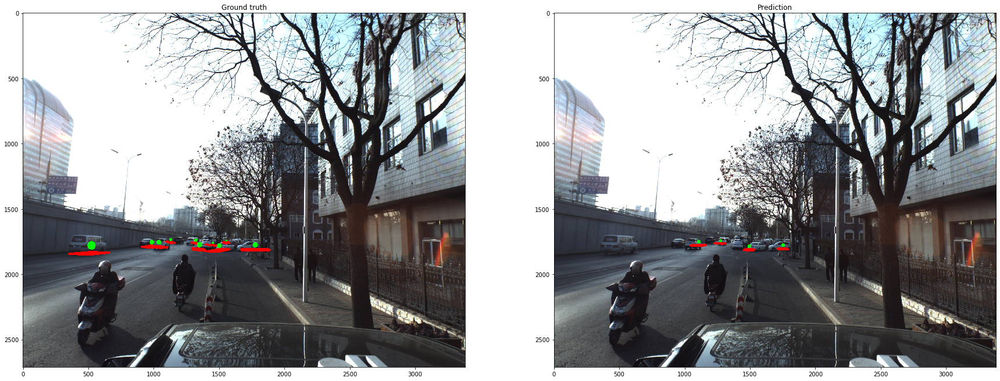

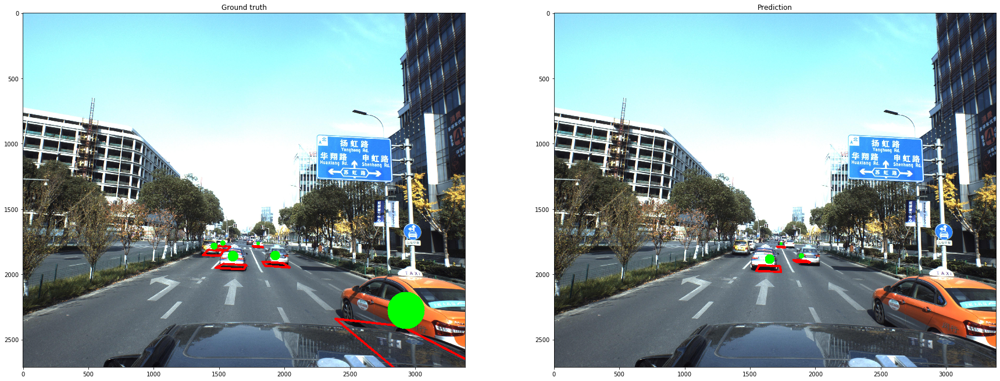

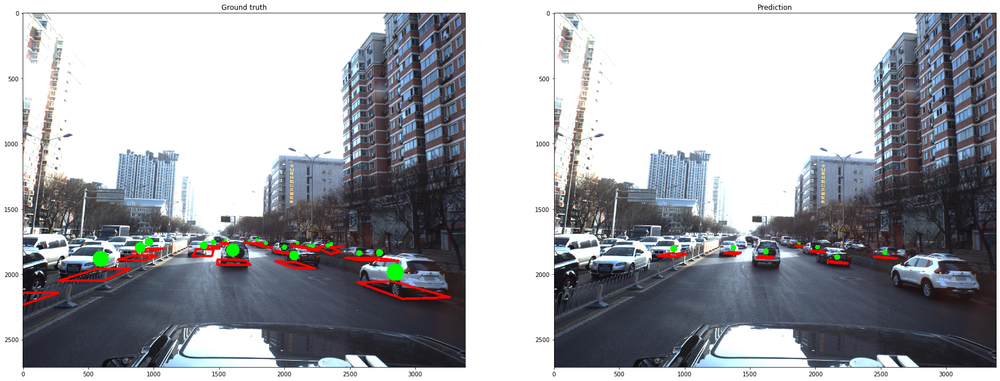

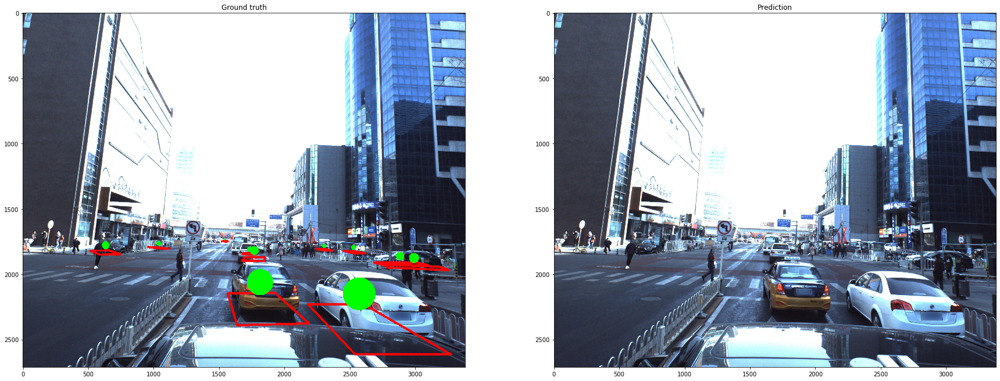

In [40]:
torch.cuda.empty_cache()
gc.collect()

for idx in range(8):
    img, mask, regr = dev_dataset[idx]
    
    output = model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
    coords_pred = extract_coords(output[0])
    coords_true = extract_coords(np.concatenate([mask[None], regr], 0))
    
    img = imread(train_images_dir.format(df_dev['ImageId'].iloc[idx]))
    
    fig, axes = plt.subplots(1, 2, figsize=(30,30))
    axes[0].set_title('Ground truth')
    axes[0].imshow(visualize(img, coords_true))
    axes[1].set_title('Prediction')
    axes[1].imshow(visualize(img, coords_pred))
    plt.show()

In [41]:
# taken from kernel of @its7171 
val_preds = []
dev_dataset = CarDataset(df_dev, train_images_dir,transform =False)

dev_loader = DataLoader(dataset=dev_dataset, batch_size=4, shuffle=False, num_workers=4)


for img, _, _ in tqdm(dev_loader):
    with torch.no_grad():
        output = model(img.to(device))
    output = output.data.cpu().numpy()
    for out in output:
        coords = extract_coords(out)
        s = coords2str(coords)
        val_preds.append(s)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


In [42]:
df_dev['PredictionString'] = val_preds
df_dev.head()
df_dev.to_csv('val_predictions.csv', index=False)


In [43]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from math import sqrt, acos, pi, sin, cos
from scipy.spatial.transform import Rotation as R
from sklearn.metrics import average_precision_score
from multiprocessing import Pool

def expand_df(df, PredictionStringCols):
    df = df.dropna().copy()
    df['NumCars'] = [int((x.count(' ')+1)/7) for x in df['PredictionString']]

    image_id_expanded = [item for item, count in zip(df['ImageId'], df['NumCars']) for i in range(count)]
    prediction_strings_expanded = df['PredictionString'].str.split(' ',expand = True).values.reshape(-1,7).astype(float)
    prediction_strings_expanded = prediction_strings_expanded[~np.isnan(prediction_strings_expanded).all(axis=1)]
    df = pd.DataFrame(
        {
            'ImageId': image_id_expanded,
            PredictionStringCols[0]:prediction_strings_expanded[:,0],
            PredictionStringCols[1]:prediction_strings_expanded[:,1],
            PredictionStringCols[2]:prediction_strings_expanded[:,2],
            PredictionStringCols[3]:prediction_strings_expanded[:,3],
            PredictionStringCols[4]:prediction_strings_expanded[:,4],
            PredictionStringCols[5]:prediction_strings_expanded[:,5],
            PredictionStringCols[6]:prediction_strings_expanded[:,6]
        })
    return df

def str2coords(s, names):
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
    return coords

def TranslationDistance(p,g, abs_dist = False):
    dx = p['x'] - g['x']
    dy = p['y'] - g['y']
    dz = p['z'] - g['z']
    diff0 = (g['x']**2 + g['y']**2 + g['z']**2)**0.5
    diff1 = (dx**2 + dy**2 + dz**2)**0.5
    if abs_dist:
        diff = diff1
    else:
        diff = diff1/diff0
    return diff

def RotationDistance(p, g):
    true=[ g['pitch'] ,g['yaw'] ,g['roll'] ]
    pred=[ p['pitch'] ,p['yaw'] ,p['roll'] ]
    q1 = R.from_euler('xyz', true)
    q2 = R.from_euler('xyz', pred)
    diff = R.inv(q2) * q1
    W = np.clip(diff.as_quat()[-1], -1., 1.)
    
    # in the official metrics code:
    # https://www.kaggle.com/c/pku-autonomous-driving/overview/evaluation
    #   return Object3D.RadianToDegree( Math.Acos(diff.W) )
    # this code treat θ and θ+2π differntly.
    # So this should be fixed as follows.
    W = (acos(W)*360)/pi
    if W > 180:
        W = 360 - W
    return W

In [44]:
thres_tr_list = [0.1, 0.09, 0.08, 0.07, 0.06, 0.05, 0.04, 0.03, 0.02, 0.01]
thres_ro_list = [50, 45, 40, 35, 30, 25, 20, 15, 10, 5]

def check_match(idx):
    keep_gt=False
    thre_tr_dist = thres_tr_list[idx]
    thre_ro_dist = thres_ro_list[idx]
    train_dict = {imgID:str2coords(s, names=['carid_or_score', 'pitch', 'yaw', 'roll', 'x', 'y', 'z']) for imgID,s in zip(train_df['ImageId'],train_df['PredictionString'])}
    valid_dict = {imgID:str2coords(s, names=['pitch', 'yaw', 'roll', 'x', 'y', 'z', 'carid_or_score']) for imgID,s in zip(valid_df['ImageId'],valid_df['PredictionString'])}
    result_flg = [] # 1 for TP, 0 for FP
    scores = []
    MAX_VAL = 10**10
    for img_id in valid_dict:
        for pcar in sorted(valid_dict[img_id], key=lambda x: -x['carid_or_score']):
            # find nearest GT
            min_tr_dist = MAX_VAL
            min_idx = -1
            for idx, gcar in enumerate(train_dict[img_id]):
                tr_dist = TranslationDistance(pcar,gcar)
                if tr_dist < min_tr_dist:
                    min_tr_dist = tr_dist
                    min_ro_dist = RotationDistance(pcar,gcar)
                    min_idx = idx
                    
            # set the result
            if min_tr_dist < thre_tr_dist and min_ro_dist < thre_ro_dist:
                if not keep_gt:
                    train_dict[img_id].pop(min_idx)
                result_flg.append(1)
            else:
                result_flg.append(0)
            scores.append(pcar['carid_or_score'])
    
    return result_flg, scores


In [46]:
valid_df = pd.read_csv('val_predictions.csv')
expanded_valid_df = expand_df(valid_df, ['pitch','yaw','roll','x','y','z','Score'])
valid_df = valid_df.fillna('')

train_df = pd.read_csv(PATH + 'train.csv')
train_df = train_df[train_df.ImageId.isin(valid_df.ImageId.unique())]
# data description page says, The pose information is formatted as
# model type, yaw, pitch, roll, x, y, z
# but it doesn't, and it should be
# model type, pitch, yaw, roll, x, y, z
expanded_train_df = expand_df(train_df, ['model_type','pitch','yaw','roll','x','y','z'])

max_workers = 10
n_gt = len(expanded_train_df)
ap_list = []
p = Pool(processes=max_workers)
for result_flg, scores in p.imap(check_match, range(10)):
    if np.sum(result_flg) > 0:
        n_tp = np.sum(result_flg)
        recall = n_tp/n_gt
        ap = average_precision_score(result_flg, scores)*recall
    else:
        ap = 0
    ap_list.append(ap)
map = np.mean(ap_list)
print('map:', map)

map: 0.005644931097441326


# Make submission

In [ ]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [ ]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

for img, _, _ in tqdm(test_loader):
    with torch.no_grad():
        output = model(img.to(device))
    output = output.data.cpu().numpy()
    for out in output:
        coords = extract_coords(out)
        s = coords2str(coords)
        predictions.append(s)

In [ ]:
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions.csv', index=False)
test.head()